In [1]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import os

In [2]:
Imperial_file = "ImperialMarch60.wav"
Cantina_file = "CantinaBand60.wav"
Elephant_file = "BabyElephantWalk60.wav"

In [3]:
ipd.Audio(Imperial_file)

In [4]:
ipd.Audio(Elephant_file)

In [5]:
ipd.Audio(Cantina_file)

In [6]:
Imperial, sr = librosa.load(Imperial_file)
Cantina,sr = librosa.load(Cantina_file)
Elephant,sr = librosa.load(Elephant_file)


In [7]:
FRAME_SIZE=2048
HOP_LENGTH=512

In [8]:
#Doing the Short time Fourier Transform

stft_Imperial=librosa.stft(Imperial,n_fft=FRAME_SIZE,hop_length=HOP_LENGTH)

In [9]:
stft_Imperial.shape

(1025, 2584)

In [10]:
#Taking the absolute vale, because we are again interested in the magnitude

spectrogram_Imperial=abs(stft_Imperial)**2
spectrogram_Imperial.shape

(1025, 2584)

In [15]:
#Defining a function to plot the spectrogram of a signal

def plot_spectrogram(spectrogram,title,sr,hop_length,y_axis="linear"): #Since we choose y_axis=linear, we will not see that much
    plt.figure(figsize=(20,10))
    librosa.display.specshow(spectrogram,sr=sr,hop_length=hop_length,x_axis="time",y_axis=y_axis) #Specshow gives us directly a spectrogram
    plt.title(title)
    plt.colorbar()
    plt.show()

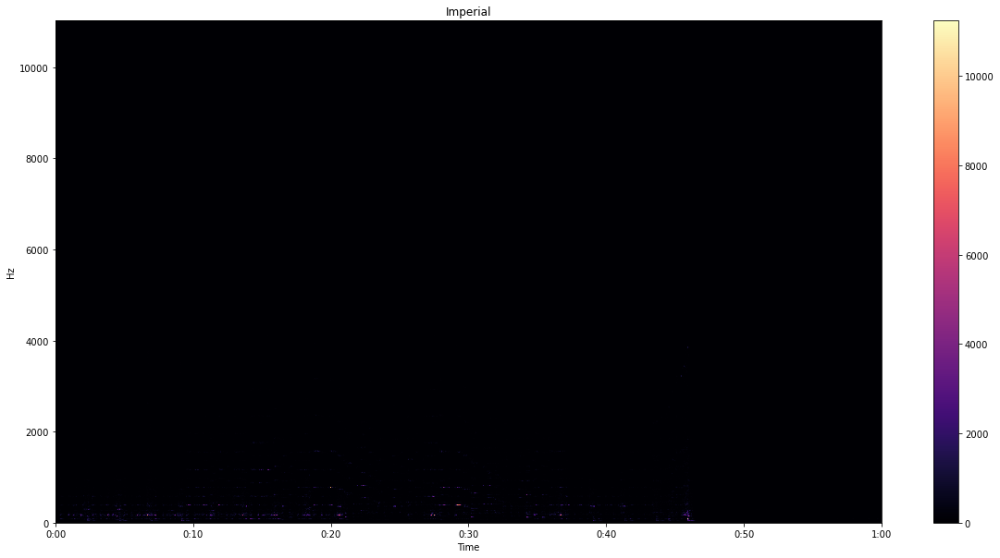

In [16]:
plot_spectrogram(spectrogram_Imperial,'Imperial',sr,HOP_LENGTH,y_axis="linear")

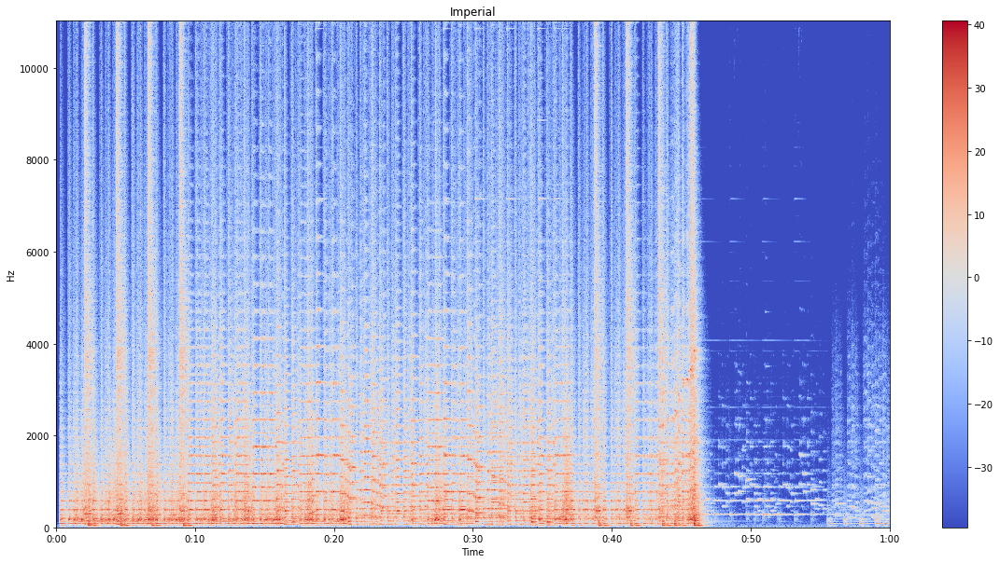

In [17]:
#Transforming our intensity to a log scale by using power_to_db

spectrogram_Imperial_log_scale=librosa.power_to_db(spectrogram_Imperial)
plot_spectrogram(spectrogram_Imperial_log_scale,'Imperial',sr,HOP_LENGTH)

In [18]:
#Doing the same for the other files

stft_Elephant=librosa.stft(Elephant,n_fft=FRAME_SIZE,hop_length=HOP_LENGTH)
stft_Cantina=librosa.stft(Cantina,n_fft=FRAME_SIZE,hop_length=HOP_LENGTH)

spectrogram_Elephant=abs(stft_Elephant)**2
spectrogram_Cantina=abs(stft_Cantina)**2

spectrogram_Elephant_log_scale=librosa.power_to_db(spectrogram_Elephant)
spectrogram_Cantina_log_scale=librosa.power_to_db(spectrogram_Cantina)

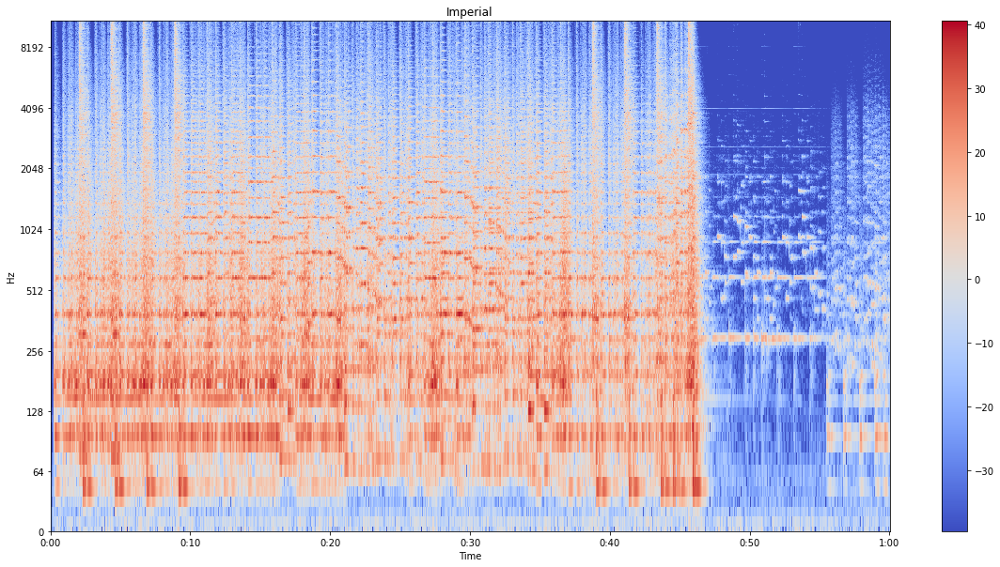

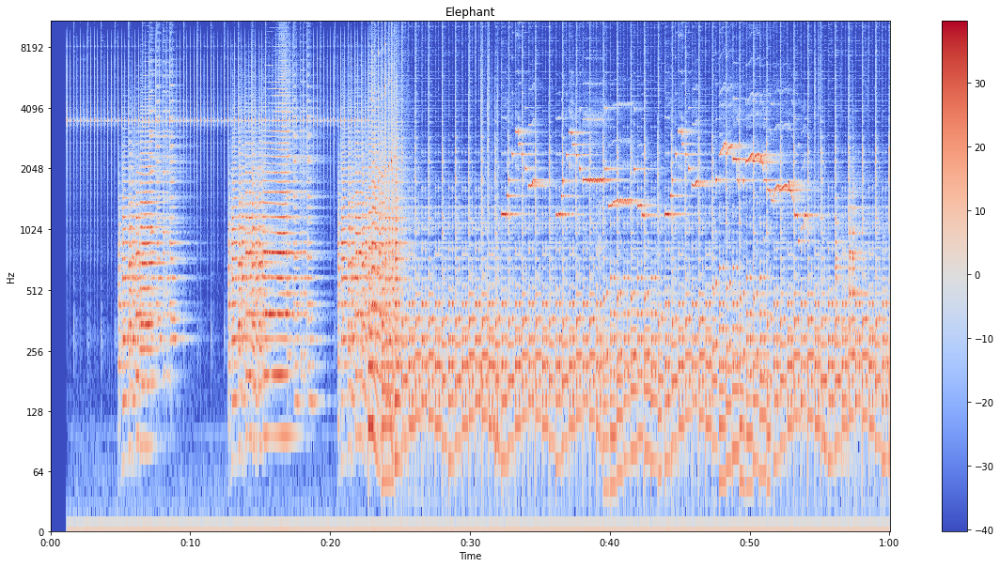

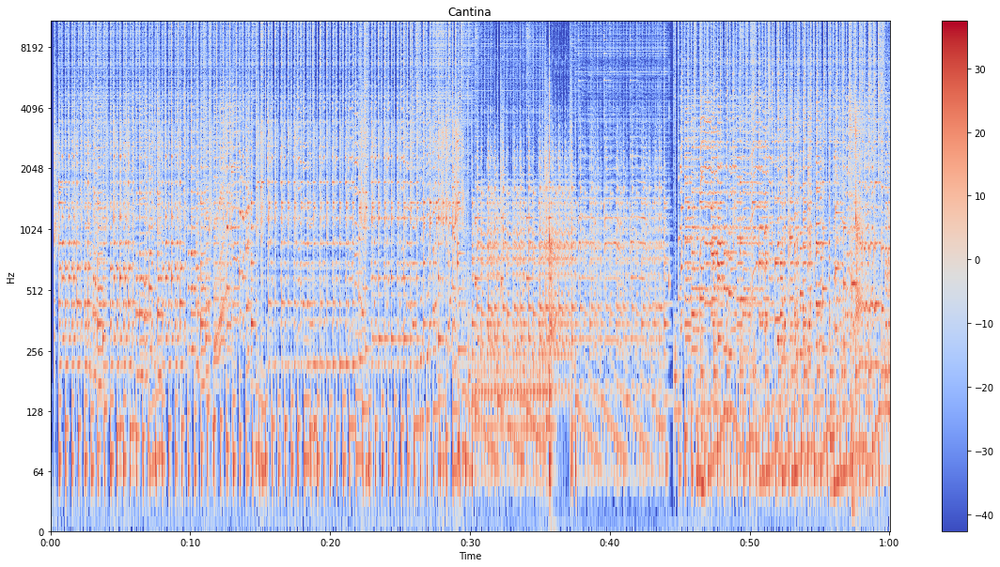

In [19]:
#Plotting our spectrograms by also using a log-scale for our y_axis

plot_spectrogram(spectrogram_Imperial_log_scale,'Imperial',sr,HOP_LENGTH,y_axis="log")
plot_spectrogram(spectrogram_Elephant_log_scale,'Elephant',sr,HOP_LENGTH,y_axis="log")
plot_spectrogram(spectrogram_Cantina_log_scale,'Cantina',sr,HOP_LENGTH,y_axis="log")



In [19]:
#Transforming hertz to mel

mel_spectrogram_Cantina = librosa.feature.melspectrogram(Cantina, sr=sr, n_fft=2048, hop_length=512, n_mels=100)

In [20]:
log_mel_spectrogram_Cantina = librosa.power_to_db(mel_spectrogram_Cantina)

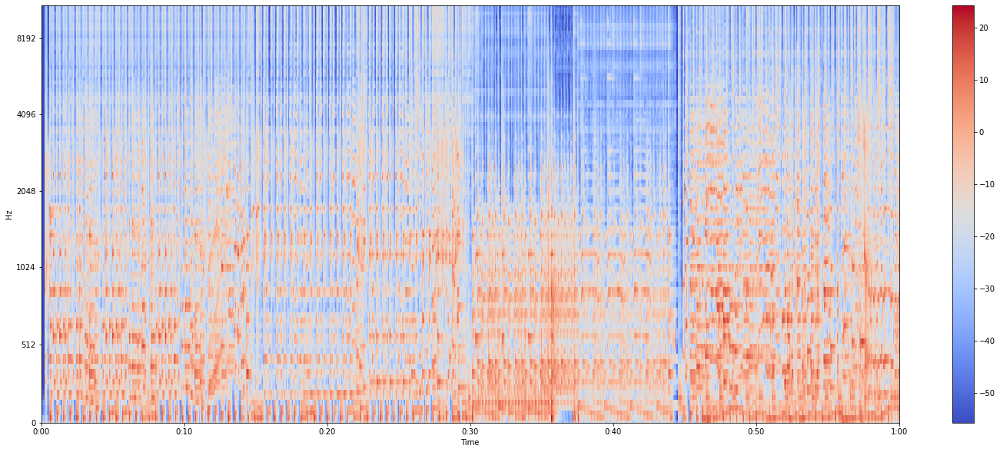

In [32]:
#I do not know why we still have Hz instead of mel on our y_axis!

plt.figure(figsize=(25, 10))
librosa.display.specshow(log_mel_spectrogram_Cantina, 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)
plt.colorbar()
plt.show()

